# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Seyedsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" /> 
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding} - HH}{\text{stride}} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding} - WW}{\text{stride}} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" /> 
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [2]:
class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        ####### TO DO : Implement Forward pass of Conv2D #######
        ########################################################

        N, C, H, W = x.shape[0], x.shape[1], x.shape[2], x.shape[3]
        F, C, HH, WW = w.shape[0], w.shape[1], w.shape[2], w.shape[3]
        pad = self.padding
        stride = self.stride
        H_out = (H + 2 * pad - HH) // (stride) + 1
        W_out = (W + 2 * pad - WW) // (stride) + 1

        padding = ((0, 0), (0, 0), (pad, pad), (pad, pad))
        x_pad = np.pad(x, padding, mode='constant', constant_values=0)

        out = np.zeros((N, F, H_out, W_out))
        for n in range(N):
            for f in range(F):
                for k in range(H_out):
                    for l in range(W_out):
                        out[n, f, k, l] = np.sum([x_pad[n][c][k * stride : k * stride + HH, l * stride : l * stride + WW] * w[f][c] for c in range(C)]) + b[f]
        
        
        ####### TO DO : End #######
        #############################

        cache = (x, w, b, x_pad)
        self.cache = cache
        return out

    def backward(self, dout):
        dx, dw, db = None, None, None

        x, w, b, x_padded = self.cache

        ####### TO DO : Implement backward pass #######
        ###############################################

        pad = self.padding
        stride = self.stride

        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        H_OUT, W_OUT = (H + 2 * pad - HH) // stride + 1, (W + 2 * pad - WW) // stride + 1

        # Initialize gradients
        dw = np.zeros_like(w)
        db = np.zeros_like(b)
        dx_padded = np.zeros_like(x_padded)

        for n in range(N):
            for f in range(F):
                for i in range(H_OUT):
                    for j in range(W_OUT):
                        dw[f] += dout[n, f, i, j] * x_padded[n, :, i * stride:i * stride + HH, j * stride:j * stride + WW]
                        dx_padded[n, :, i * stride:i * stride + HH, j * stride:j * stride + WW] += dout[n, f, i, j] * w[f]
                        db[f] += dout[n, f, i, j]


        dx = dx_padded[:, :, pad:-pad, pad:-pad]

        ####### TO DO : End #######
        #############################

        self.dx = dx
        self.dw = dw
        self.db = db
        return dx, dw, db

In [3]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [4]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4) # 2 samples each sample has 3 channels each channel is 4 by 4
w_shape = (3, 3, 4, 4) # 3 layers each layer has 3 kernels each kernel is 4 by 4
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)
out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [5]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index
    
    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval
    
    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [6]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  6.916610730091186e-09
dw error:  2.7539257419510604e-09
db error:  1.6714989213215675e-11


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [7]:
from PIL import Image

first_img, second_img = Image.open("./Images/Sample/Sharif_1.JPG"), Image.open(
    "./Images/Sample/Sharif_2.jpg"
)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

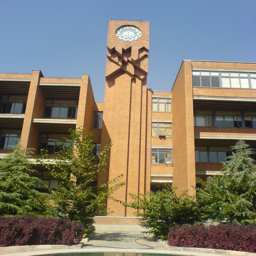

In [8]:
first_img

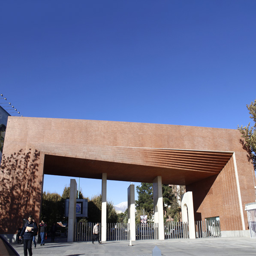

In [9]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [10]:
img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)
print(x[0].shape)

# a convolution weight, holding 4 filters 3x3
sobel_x = np.array([[[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]], 
                    [[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]], 
                    [[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]]])
sobel_y = sobel_x.transpose((0, 2, 1))
grayscale = np.array([[[0, 0, 0],
                       [0, 0.3, 0],
                       [0, 0, 0]],
                       [[0, 0, 0],
                        [0, 0.6, 0],
                        [0, 0, 0]],
                        [[0, 0, 0],
                         [0, 0.1, 0],
                         [0, 0, 0]]])
gaussian_blur = np.array([[[1, 2, 1],
                          [2, 4, 2],
                          [1, 2, 1]],
                          [[1, 2, 1],
                          [2, 4, 2],
                          [1, 2, 1]],
                          [[1, 2, 1],
                          [2, 4, 2],
                          [1, 2, 1]]]) / 16

w = np.array([sobel_x, sobel_y, grayscale, gaussian_blur])
print(w.shape)

b = np.array([0, 128, 128, 0])

conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)
print(out.shape)

(3, 256, 256)
(4, 3, 3, 3)
(2, 4, 256, 256)


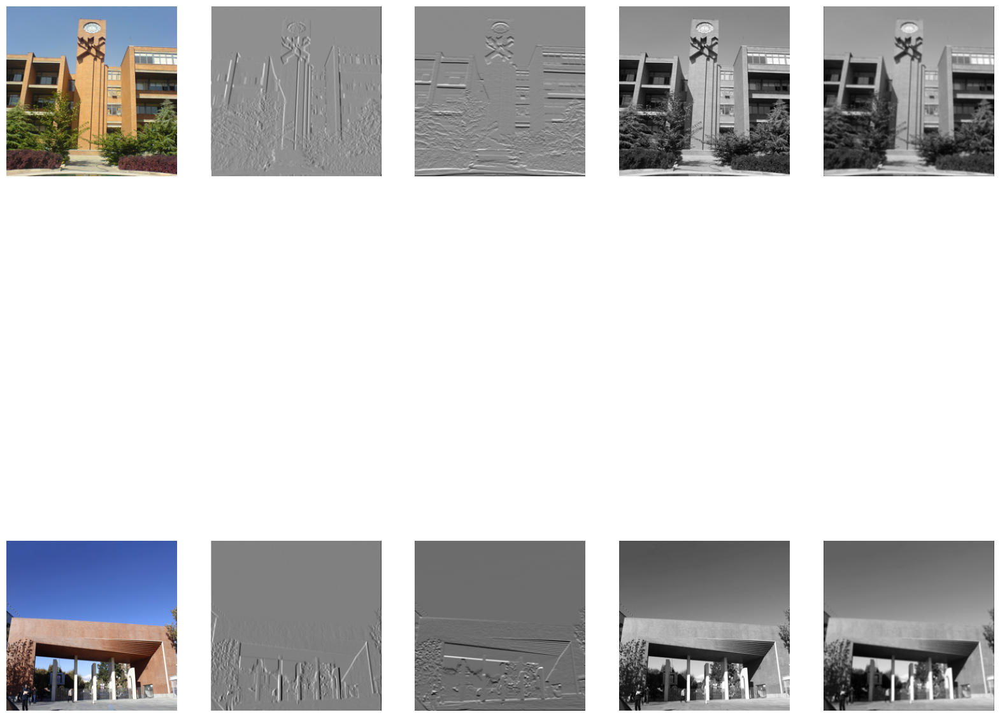

In [11]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 5, figsize=(20, 20))

axes[0, 0].imshow(first_img)
axes[0, 0].axis('off')
axes[1, 0].imshow(second_img)
axes[1, 0].axis('off')

for i in range(2):
    for j in range(4):
        axes[i, j + 1].imshow(out[i, j], cmap='gray')
        axes[i, j + 1].axis('off')

plt.show()

Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [13]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cuda')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [14]:
img_size = 512 if not device == "cpu" else 256

#TODO: Implement some transformations for the images

def transform_image(img_path, img_width, img_height):
    image = Image.open(img_path).resize((img_width, img_height))
    tensor_transform = transforms.ToTensor()
    tensor = tensor_transform(image)
    mean = tensor.mean([1, 2])
    std = tensor.std([1, 2])
    norm_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])
    return norm_transform(image)

In [15]:
style_image = transform_image('Images/Neural_Transfer/style.jpeg', img_size, img_size) # It's in Images/Neural_Transfer/Style.jpeg
content_image = transform_image('Images/Neural_Transfer/Content.jpeg', img_size, img_size) # It's in Images/Neural_Transfer/Content.jpeg

style_image.size(), content_image.size()

(torch.Size([3, 512, 512]), torch.Size([3, 512, 512]))

Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [16]:
#TODO
def imshow(tensor, title=None):
    transform = transforms.ToPILImage()
    pil_image = transform(tensor)
    plt.imshow(pil_image)
    plt.title(title)
    plt.axis(False)
    plt.show()

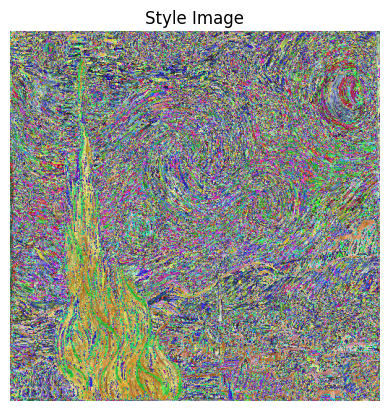

In [17]:
imshow(style_image, "Style Image")

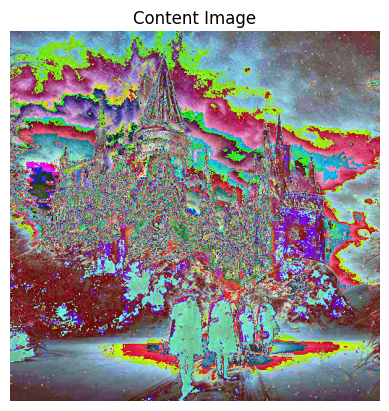

In [18]:
imshow(content_image, "Content Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [19]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [20]:
#TODO
vgg = vgg19(pretrained=True)
vgg_model_features = vgg.features
vgg_model_classifier = vgg.classifier
print(vgg_model_features)
print(vgg_model_classifier)
for param in vgg.parameters():
    param.requires_grad = False

c:\Users\Erfan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Erfan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [21]:
from torchsummary import summary

#TODO: Print the summary of the vgg_model
vgg.to(device)
summary(vgg, input_size=(3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]           1,792
              ReLU-2         [-1, 64, 512, 512]               0
            Conv2d-3         [-1, 64, 512, 512]          36,928
              ReLU-4         [-1, 64, 512, 512]               0
         MaxPool2d-5         [-1, 64, 256, 256]               0
            Conv2d-6        [-1, 128, 256, 256]          73,856
              ReLU-7        [-1, 128, 256, 256]               0
            Conv2d-8        [-1, 128, 256, 256]         147,584
              ReLU-9        [-1, 128, 256, 256]               0
        MaxPool2d-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]         295,168
             ReLU-12        [-1, 256, 128, 128]               0
           Conv2d-13        [-1, 256, 128, 128]         590,080
             ReLU-14        [-1, 256, 1

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

VGG Model is a pre-trained model that is used for: <br>
**1: Image Classification** <br> VGG models are primarily designed for image classification tasks. They have been trained on large datasets like ImageNet and can classify images into thousands of categories.<br>
**2: Feature Extraction**<br>The convolutional layers of VGG can be used to extract rich feature representations from images, which can be used in other computer vision tasks such as object detection, segmentation, and image retrieval.<br>
**3: Transfer Learning** <br> Due to their deep and expressive architectures, VGG models are often used as pre-trained models for transfer learning. By fine-tuning VGG models on smaller, domain-specific datasets, they can achieve high performance even with limited training data. <br> <br>

The features part of a VGG model consists of a series of convolutional layers and pooling layers. These layers are responsible for extracting features, reducing spatial dimensions and maintaining spaitial hierarchies. <br>
The classifier part of a VGG model consists of fully connected (FC) layers. These layers are responsible for flattening the features, making predictions and learning non-linear combinations <br>

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

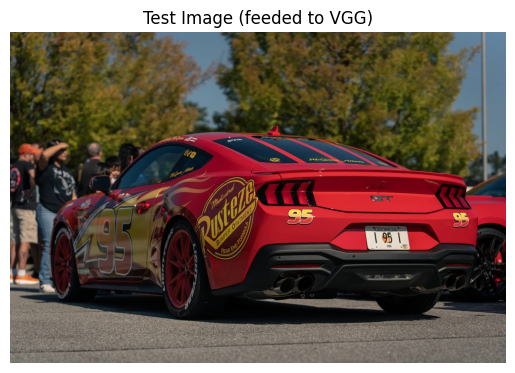

In [22]:
vgg_test_image = Image.open("./Images/Neural_Transfer/Car.jpeg")

#TODO: Plot the image which we are feeding to the model
plt.imshow(vgg_test_image)
plt.title('Test Image (feeded to VGG)')
plt.axis(False)
plt.plot()

input_tensor = transform_image("./Images/Neural_Transfer/Car.jpeg", 512, 512)
input_batch = input_tensor.unsqueeze(0)
vgg.eval()
input_batch = input_batch.to(device)
with torch.no_grad():
    output = vgg(input_batch)

#TODO: Predict the output of the vgg model for the test image (final classifier output and also each feature map output (in Conv2D layers))
...
probabilities = torch.nn.functional.softmax(output[0], dim=0)

_, predicted = torch.max(probabilities, 0)

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

In [23]:
import requests

class_idx = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()

# Get the class name
class_name = class_idx[predicted.item()]

print(f"Predicted class: {class_name}")

Predicted class: sports car


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

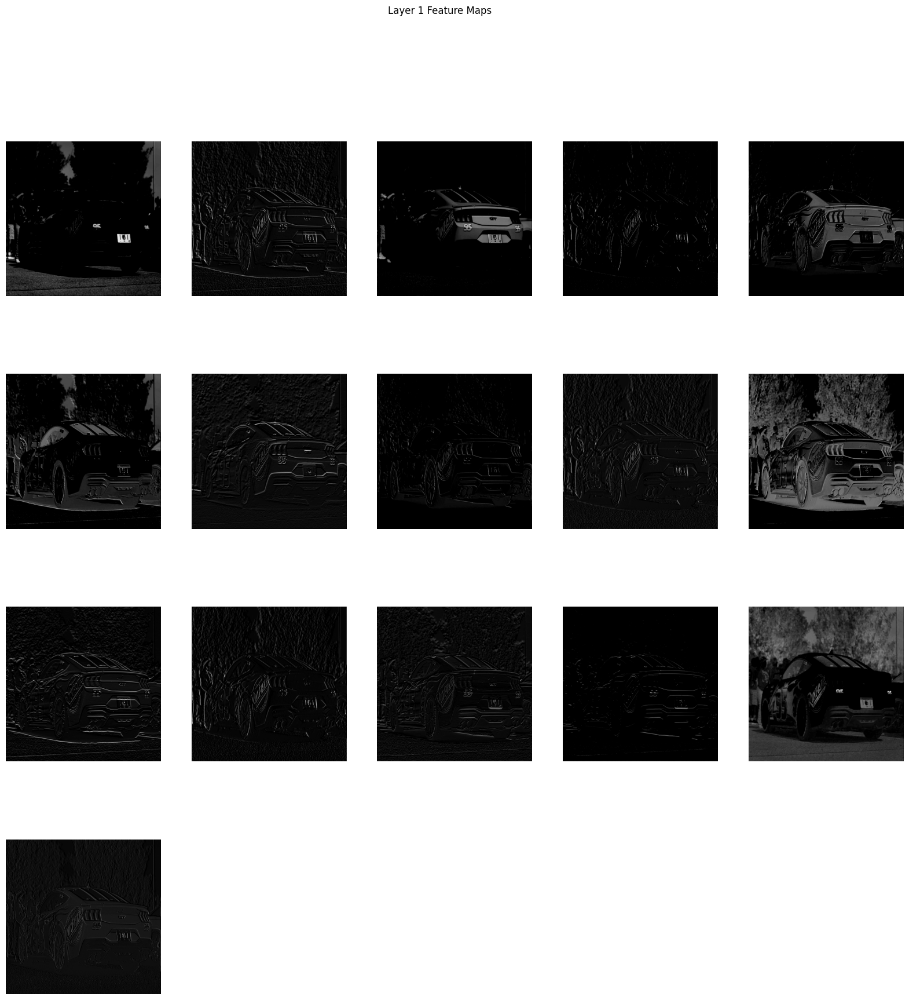

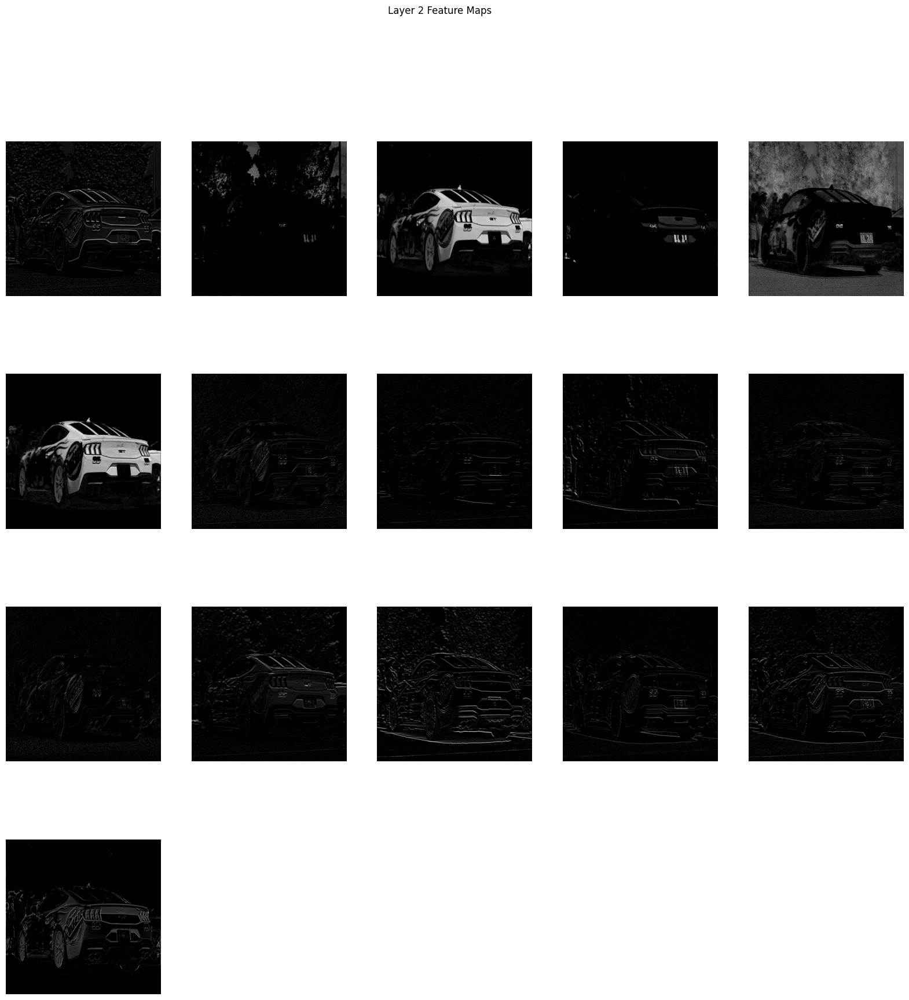

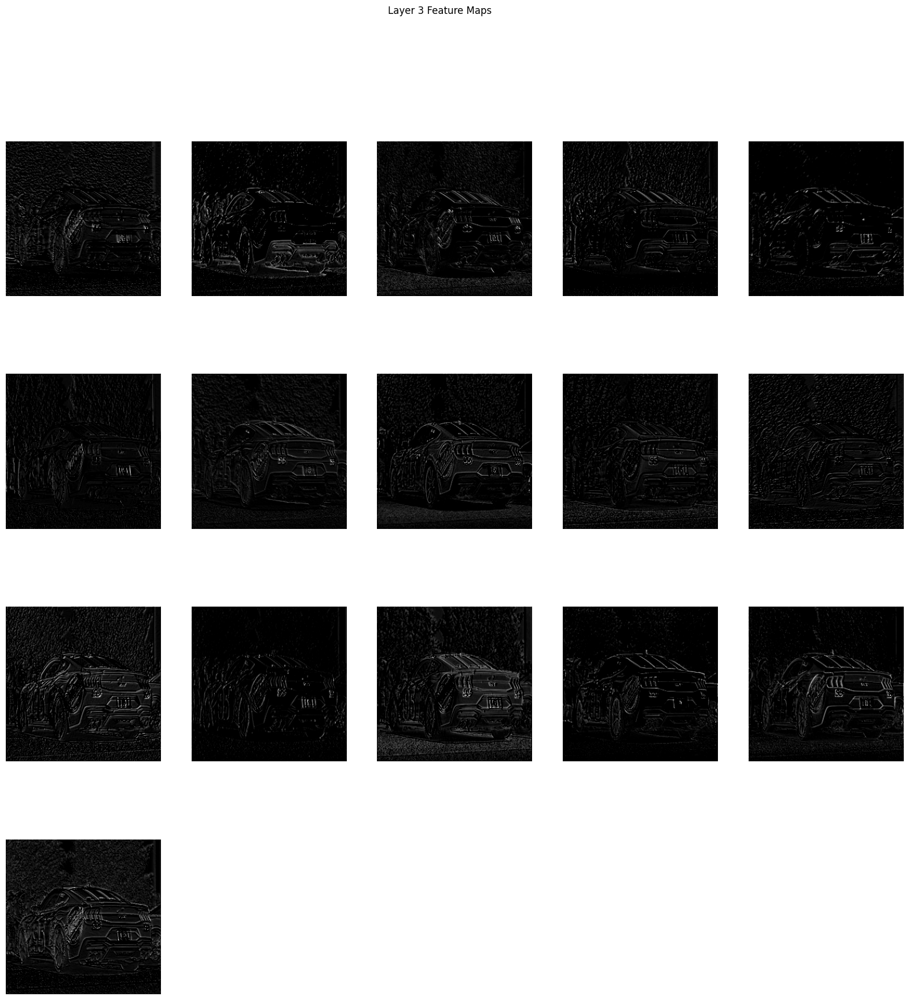

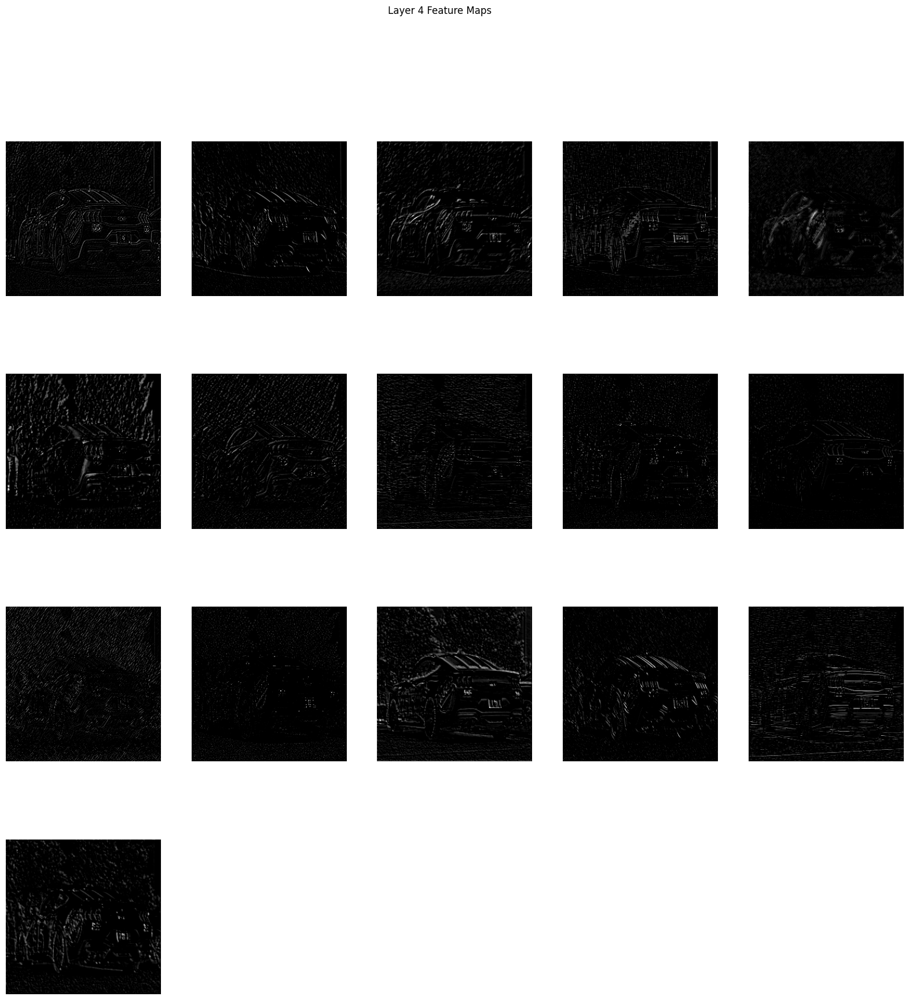

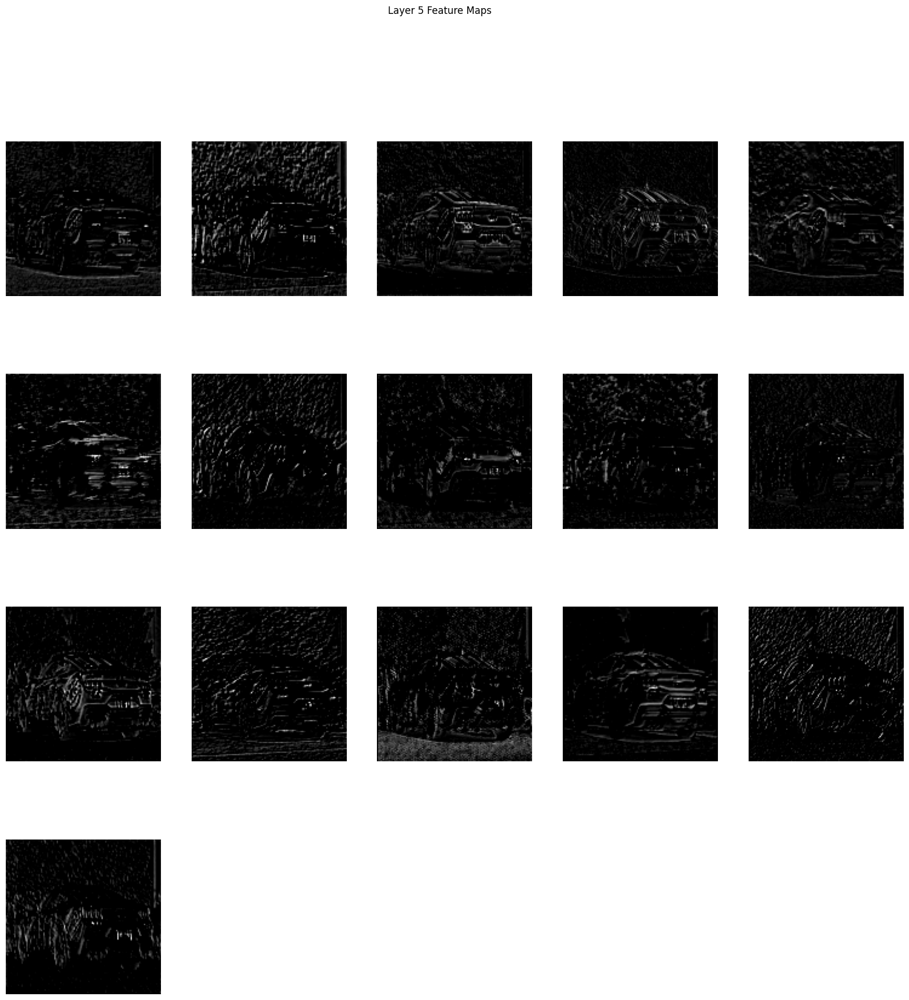

...

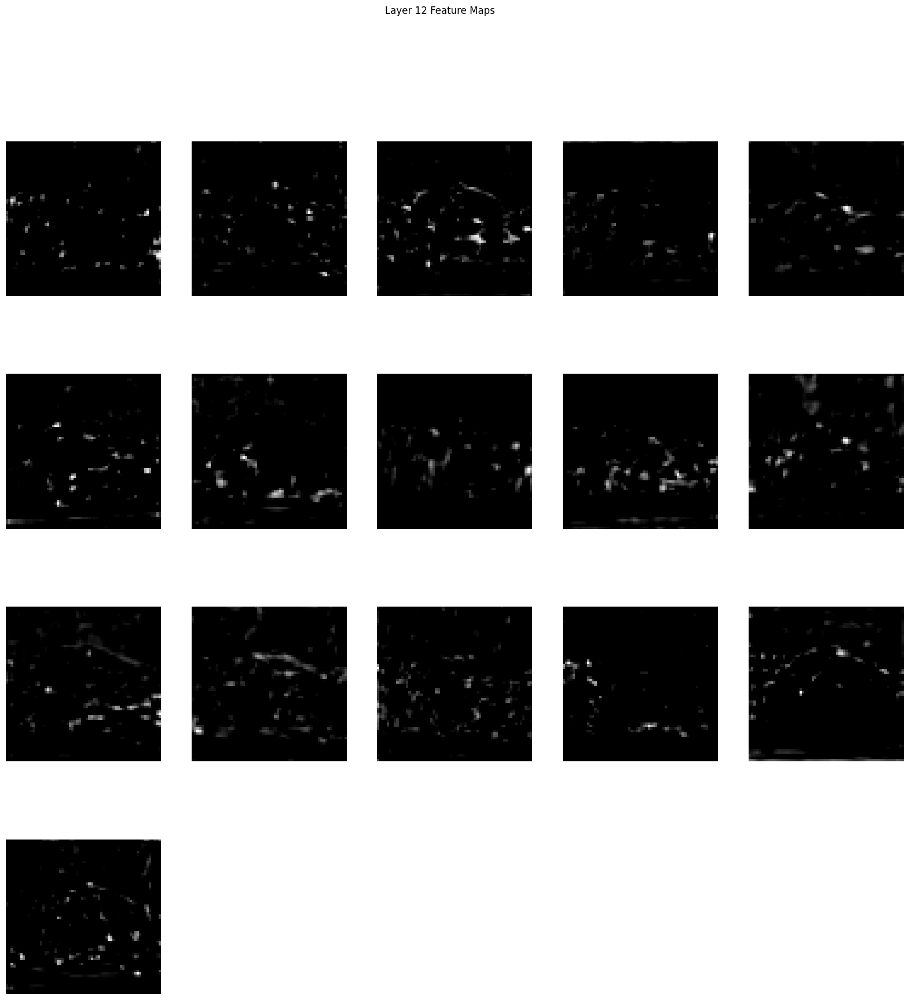

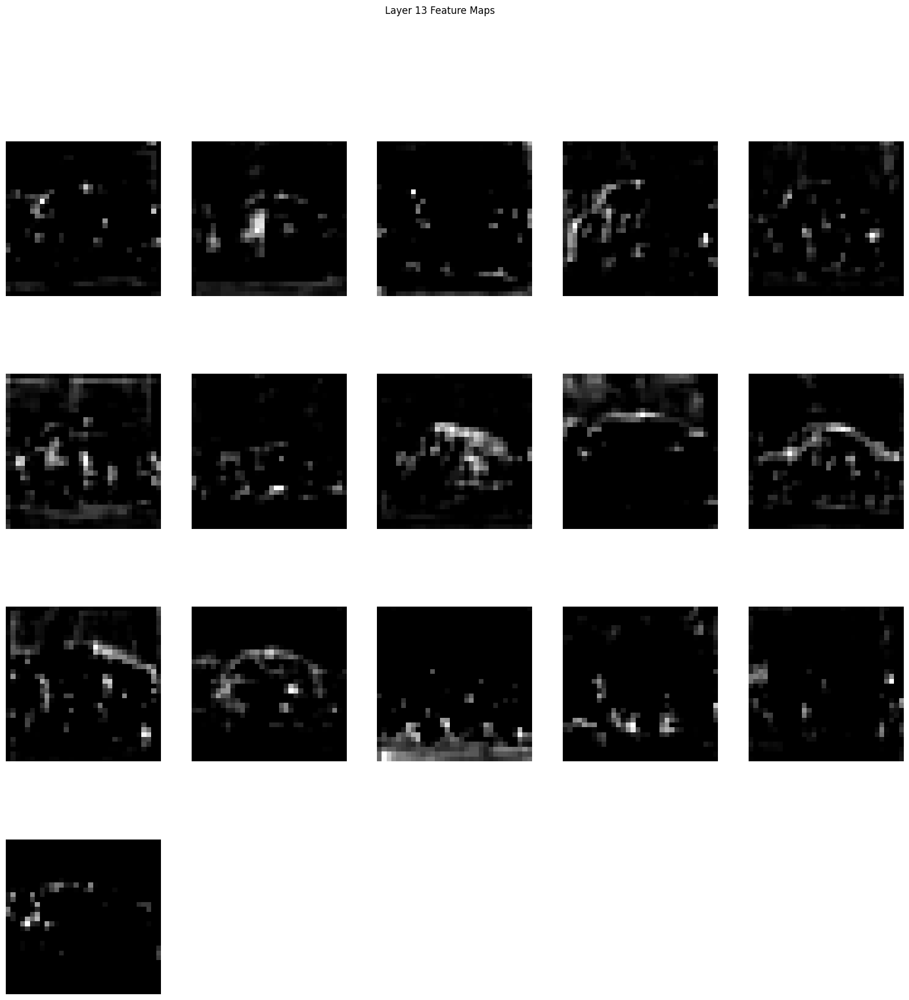

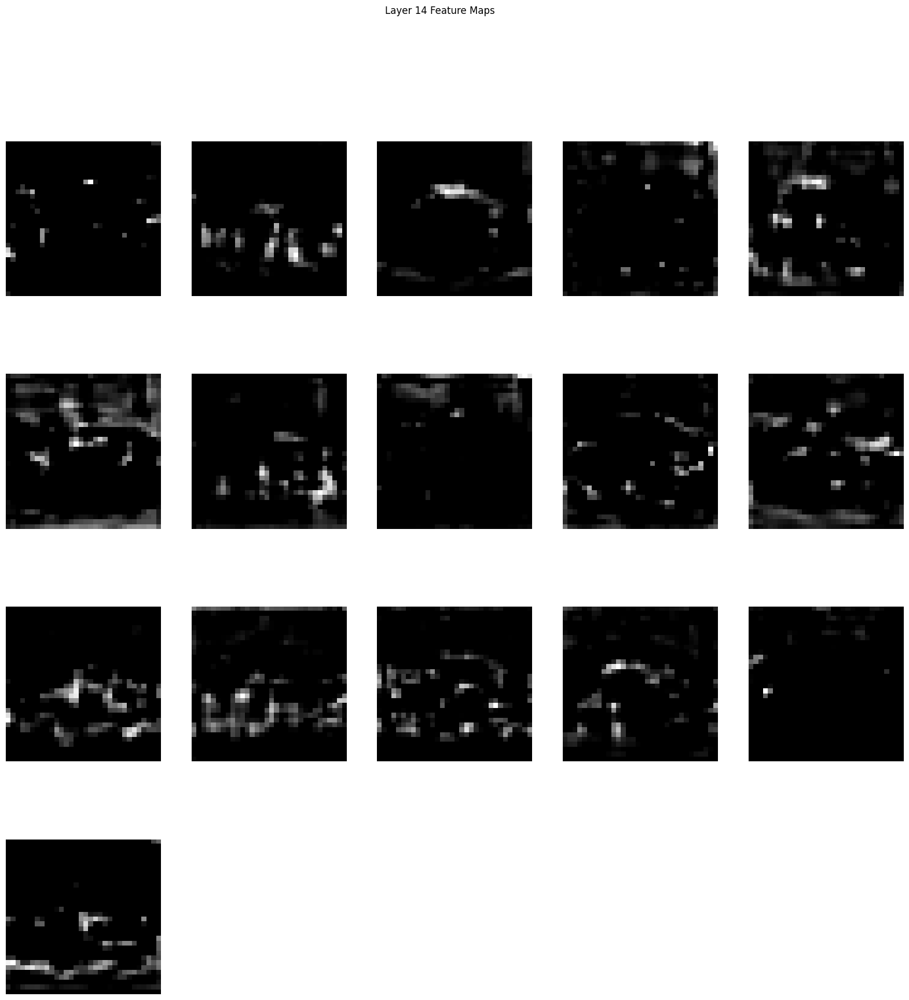

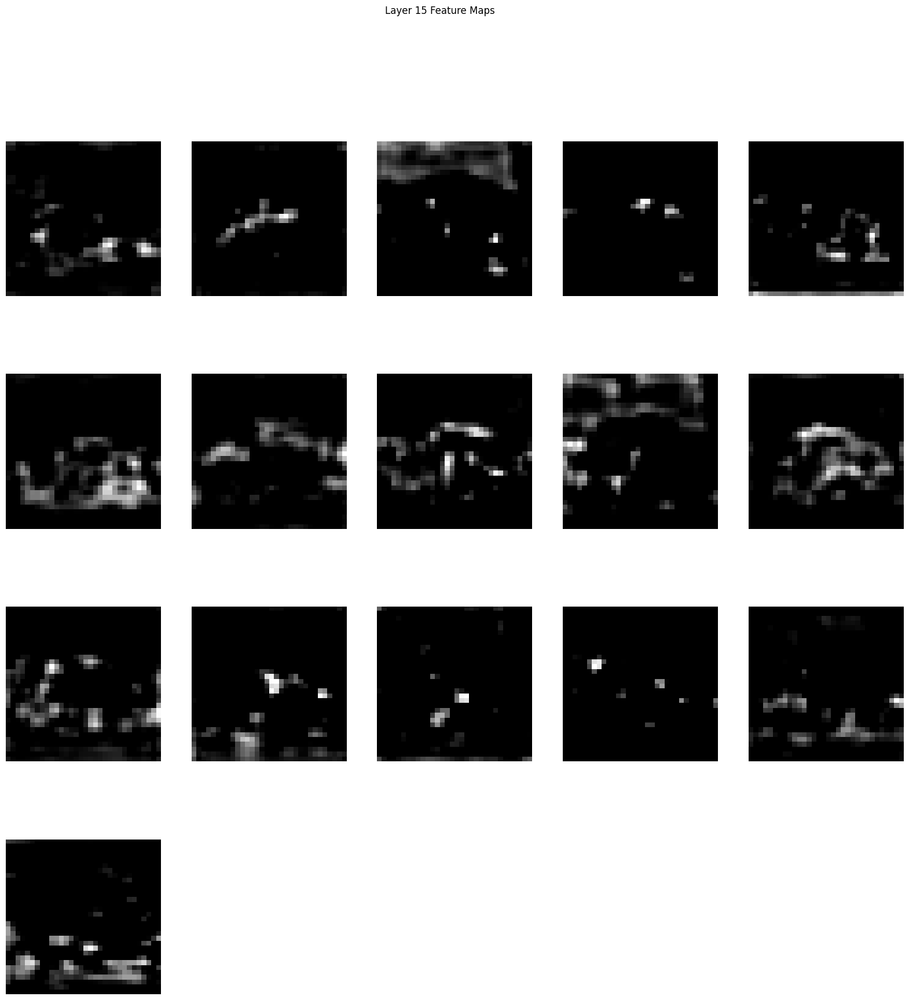

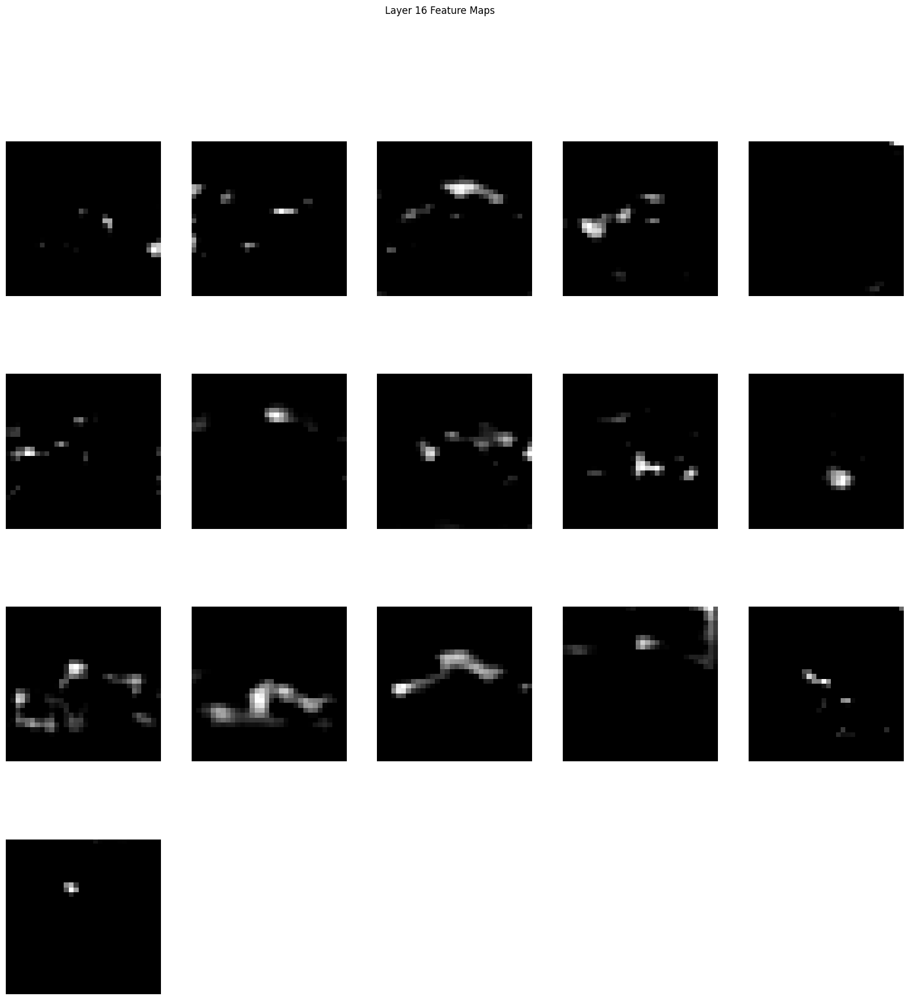

In [24]:
class VGG19FeatureExtractor(torch.nn.Module):
    def __init__(self, pretrained_model):
        super().__init__()
        self.features = []
        # Use the features part of VGG and register hooks to get the outputs
        for i, layer in enumerate(pretrained_model.features):
            self.add_module(f"layer_{i}", layer)
            if isinstance(layer, torch.nn.modules.conv.Conv2d):
                layer.register_forward_hook(self.hook)

    def hook(self, module, input, output):
        self.features.append(output)

    def forward(self, x):
        self.features = []  # Reset at each forward pass
        for layer in self._modules.values():
            x = layer(x)
        return self.features

vgg19_feature_extractor = VGG19FeatureExtractor(vgg)

with torch.no_grad():
    features = vgg19_feature_extractor(input_batch)


for layer_index, feature in enumerate(features):
    layer_features = feature[0][:16]  # Get the feature maps for the first image in the batch
    num_feature_maps = layer_features.shape[0]
    
    # Determine the number of rows and columns for the subplot
    num_cols = int(num_feature_maps**0.5) + 1
    num_rows = (num_feature_maps + num_cols - 1) // num_cols
    
    plt.figure(figsize=(20, 20))
    
    for map_index in range(num_feature_maps):
        plt.subplot(num_rows, num_cols, map_index + 1)
        plt.imshow(layer_features[map_index].cpu().detach().numpy(), cmap='gray')
        plt.axis('off')
    
    plt.suptitle(f'Layer {layer_index+1} Feature Maps')
    plt.show()

It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [25]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = nn.functional.mse_loss(input, self.target)
        return input

**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [26]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resize F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)




In [27]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [28]:
cnn = vgg19(pretrained=True).features.to(device)

# Freeze all VGG19 parameters since we are only using the network to extract features
for param in cnn.parameters():
    param.requires_grad = False

In [29]:
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # Reshape mean and std to [1, 3, 1, 1] for broadcasting
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # Normalize the image
        return (img - self.mean) / self.std

# Instantiate the normalization layer
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to('cuda')
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to('cuda')
normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to('cuda')

c:\Users\Erfan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\_device.py:77: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [30]:
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

#TODO: any processes you want to add and/or helper functions


def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std)

    # just in order to have an iterable access to or list of content/style
    # losses

    content_losses = []
    style_losses = []    

    # assuming that ``cnn`` is a ``nn.Sequential``, so we make a new ``nn.Sequential``
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ``ContentLoss``
            # and ``StyleLoss`` we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

def img_to_tensor(img):
    tensor_transformer = transforms.ToTensor()
    return tensor_transformer(img).to(device).unsqueeze(0)

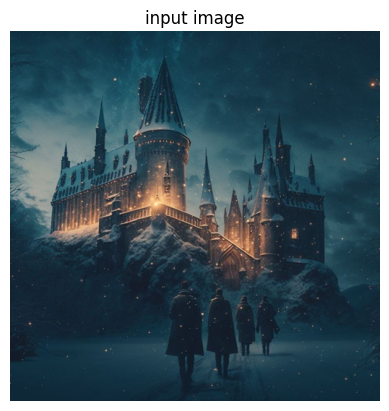

In [31]:
# Plot the input image to the model
# TODO

content_img = Image.open('Images/Neural_Transfer/Content.jpeg').resize((512, 512))
# if you want to use white noise by using the following code:
#
# ::
#
#    input_img = torch.randn(content_img.data.size())

# add the original input image to the figure:
plt.imshow(content_img)
plt.axis(False)
plt.title('input image')
plt.show()

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

[5.0, 5.0, 4.800000190734863, 3.839999198913574, 3.0719993114471436, 2.457599401473999, 1.966079592704773, 1.5728636980056763, 1.2582908868789673, 1.006632685661316, 0.8053061962127686, 0.644244909286499, 0.5153959393501282, 0.4123167395591736, 0.3298533856868744, 0.26388269662857056, 0.21110615134239197, 0.16888491809368134, 0.13510793447494507, 0.10808634757995605, 0.08646907657384872, 0.06917526572942734, 0.05534021183848381, 0.04427216947078705, 0.03541773557662964, 0.02833418920636177, 0.022667350247502327, 0.01813388057053089, 0.014507104642689228, 0.011605683714151382, 0.009284546598792076, 0.007427637465298176, 0.005942109972238541, 0.004753687884658575, 0.003802950493991375, 0.0030423603020608425, 0.00243388838134706, 0.0019471105188131332, 0.0015576884616166353, 0.0012461506994441152, 0.0009969205129891634, 0.0007975364569574594, 0.000638029130641371, 0.0005104232695885003, 0.0004083386156708002, 0.000326670880895108, 0.0002613367105368525, 0.00020906937425024807, 0.000167255

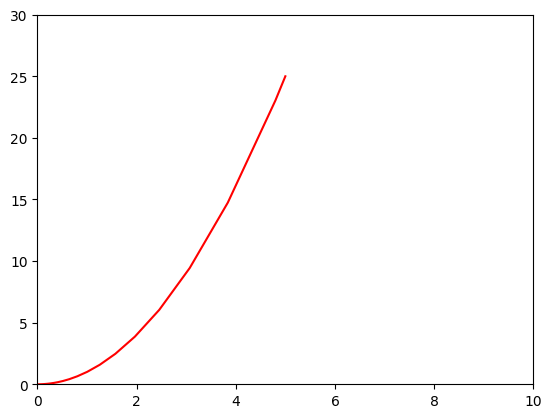

In [32]:
import torch
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import IPython.display as display
from torch.optim import LBFGS


def quadratic_function(x):
    return x ** 2

# Initialize a tensor with a single random value
x = torch.tensor([5.0], requires_grad=True)

# Use LBFGS optimizer
optimizer = LBFGS([x], lr=0.2)

# Store x values for animation
x_values = [x.item()]

def closure():
    optimizer.zero_grad()
    loss = quadratic_function(x)
    loss.backward()
    x_values.append(x.item())
    return loss

# Optimization loop
for i in range(10):
    optimizer.step(closure)

# Prepare the animation
fig, ax = plt.subplots()
ax.set_xlim(0, 10)
ax.set_ylim(0, quadratic_function(torch.tensor([5.0])).item() + 5)  # Adjust the y-axis limit

# Initial plot
print(x_values)
x_tensor = torch.tensor(x_values)
y_values = quadratic_function(x_tensor).detach().cpu().numpy()
line, = ax.plot(range(len(x_values)), y_values, 'r-')

def update(num):
    # Ensure that values up to the current frame are used
    x_tensor = torch.tensor(x_values[:num+1])
    y_values = quadratic_function(x_tensor).detach().cpu().numpy()  # Ensure it's on CPU and converted
    line.set_data(x_values[:num+1], y_values)
    return line,

ani = animation.FuncAnimation(fig, update, frames=len(x_values), blit=True, repeat=False)

# Optionally display the animation in Jupyter
display.display(display.HTML(ani.to_jshtml()))


(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

Building the style transfer model..
Optimizing..


c:\Users\Erfan\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\utils\_device.py:77: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


run [50]:
Style Loss : 38.128853 Content Loss: 31.779156


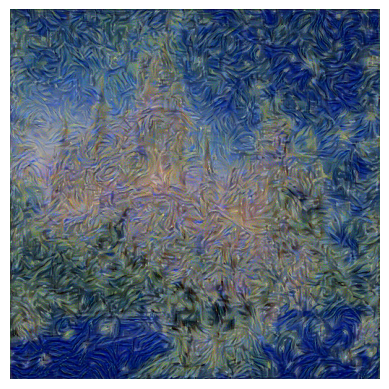


run [100]:
Style Loss : 9.418053 Content Loss: 28.222584


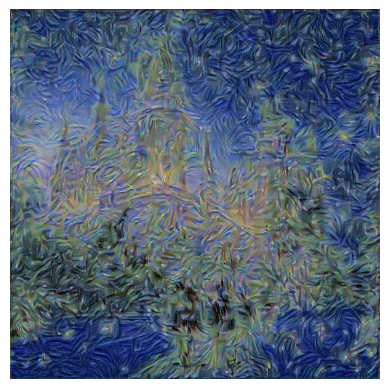


run [150]:
Style Loss : 5.146904 Content Loss: 24.170877


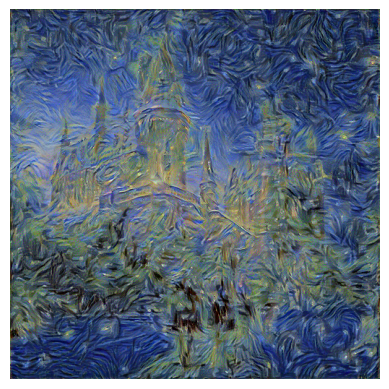


run [200]:
Style Loss : 3.577924 Content Loss: 21.234400


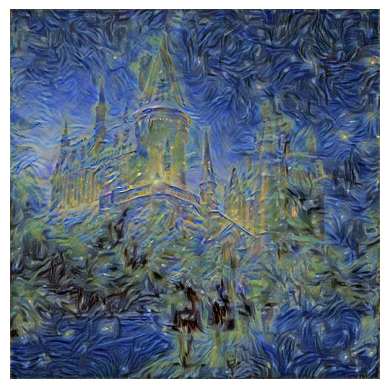


run [250]:
Style Loss : 2.705582 Content Loss: 19.122906


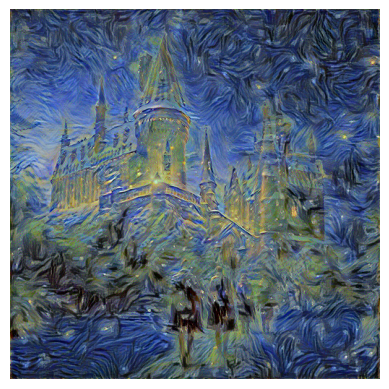


run [300]:
Style Loss : 2.073984 Content Loss: 17.620060


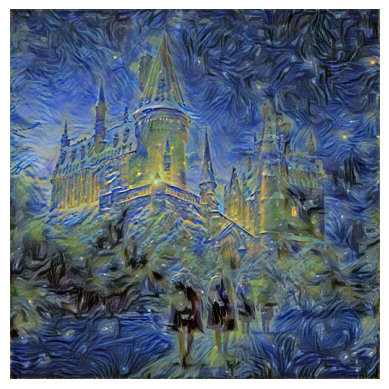

In [33]:
# Train your model using LBFGS optimizer and 2 implemented losses (style loss and content loss)
# You should report the `style loss`, `content loss`, and `total loss` for each iteration. Note that `total loss`
# is the sum of `style loss` and `content loss` with some weights (alpha and beta) which you should tune them.
# Also, please plot the image each 50 iterations.
# An important note is that your optimizer might change the values of the image tensor in a way that the pixel values
# are no longer in the range of [0, 1] (in normalized format). So, you should clip the values of the image tensor
# to be in the range of [0, 1] after each iteration, to prevent any problems occuring to your image.
# TODO

def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer

unloader = transforms.ToPILImage()

plot_style_losses = []
plot_content_losses = []
plot_total_losses = []

def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    input_img.requires_grad_(True)
    model.eval()
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                with torch.no_grad():
                    input_img.clamp_(0, 1)
                plt.imshow(unloader(input_img.detach().cpu().squeeze(0)))
                plt.axis(False)
                plt.show()
                print()
            plot_style_losses.append(style_score.item())
            plot_content_losses.append(content_score.item())
            plot_total_losses.append(style_score.item() + content_score.item())

            return style_score + content_score

        optimizer.step(closure)

    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

tensor_style_img = img_to_tensor(Image.open('Images/Neural_Transfer/style.jpeg').resize((512, 512)))
tensor_content_img = img_to_tensor(content_img)

output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            tensor_content_img, tensor_style_img, tensor_content_img)

Now, let's see the result of optimization process on our `input_image`.

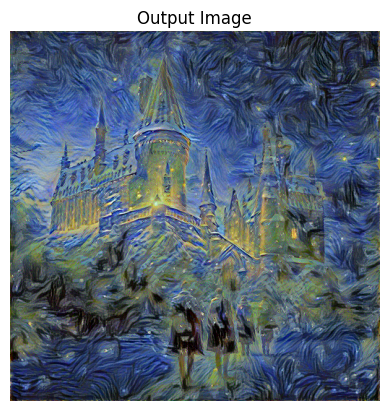

In [34]:
# TODO: Plot the final image
...
plt.imshow(unloader(output.cpu().squeeze(0)))
plt.title('Output Image')
plt.axis(False)
plt.show()

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

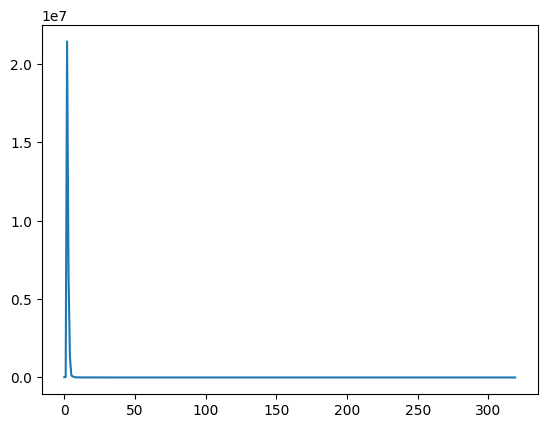

In [37]:
#TODO: Plot the total weighted loss w.r.t. the iteration number
...
plt.plot(plot_style_losses)
plt.show()

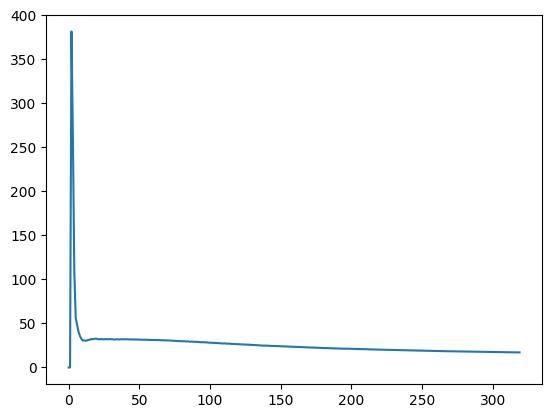

In [38]:
plt.plot(plot_content_losses)
plt.show()

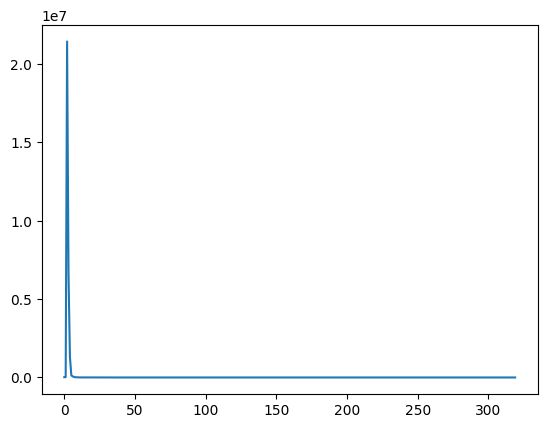

In [39]:
plt.plot(plot_total_losses)
plt.show()